# Test access to Google Gemini 3 pro - Image
https://console.cloud.google.com/vertex-ai/publishers/google/model-garden/gemini-3-pro-preview

Gemini 3 Pro is designed to tackle the most challenging agentic problems with strong coding and state-of-the-art reasoning capabilities. It is the **best model for complex multimodal understanding**. Compared to Gemini 2.5 Pro, it improves significantly on complex instruction following and delivers outcomes with better output efficiency.

Gemini 3.0 models are thinking models, capable of reasoning through their thoughts before responding, resulting in enhanced performance and improved accuracy.

The Gemini 3 Pro Preview model is now available on Vertex AI.

Gemini 3 Pro Preview is also available through our Gen AI SDK that provides a unified interface for Google AI Studio and Vertex AI in Python and Go.



## pre-requisistes

- gcloud console tool (as this will manage authentication)
  - for CURL calls:
    > gcloud auth login
  - for SDK calls:
    > gcloud auth application-default login
- enable model in model hub



## login
(only required once per session + zscaler security should be turned off)

In [1]:
!gcloud auth application-default login

Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=764086051850-6qr4p6gpi6hn506pt8ejuq83di341hur.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8085%2F&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fcloud-platform+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fsqlservice.login&state=NR5hI430OpKa5wHBoZxPV5vcAAlIBD&access_type=offline&code_challenge=rMz0VI-3oYm-iltIr2BwM6K7OM004e-7AuzaS7aYA48&code_challenge_method=S256


Credentials saved to file: [C:\Users\potar\AppData\Roaming\gcloud\application_default_credentials.json]

These credentials will be used by any library that requests Application Default Credentials (ADC).
Cannot find a quota project to add to ADC. You might receive a "quota exceeded" or "API not enabled" error. Run $ gcloud auth application-default set-quota-project to add a quota project.


## config

In [2]:
# Add all available artwork files here
# ARTWORK_FILE = "1948156_1419323_SIM_2"
# ARTWORK_FILE = "1991965_1825900_SIM"
# ARTWORK_FILE = "2741283_1961801_SIM"
# ARTWORK_FILE = "3019232_2965651_SIM"
# ARTWORK_FILE = "30511509_2"
# ARTWORK_FILE = "30633405_4"
ARTWORK_FILE = "30652435_1"
# ARTWORK_FILE = "30660179_2"
# ARTWORK_FILE = "30661064_2"
# ARTWORK_FILE = "30696442_2"
# ARTWORK_FILE = "30690350_1"
# ARTWORK_FILE = "30698797_1"
# ARTWORK_FILE = "30698853_2"
# ARTWORK_FILE = "30698938_1"
# ARTWORK_FILE = "30698973_1"
# ARTWORK_FILE = "30699352_1"

# Active file
#ARTWORK_FILE = "30678229_1"


DPI = 300
FILE_PATH_IN = "../data/in"
FILE_PATH_OUT = "../data/out"

In [3]:
PROJECT_ID="hmcp-tst-veraitst-de-prj-arg"
MODEL="gemini-3-pro-preview"
LOCATION="global"

## load required libraries

In [4]:
from IPython.display import JSON, Image, Markdown, display
from google import genai
from google.genai import types
import fitz
import base64
from PIL import Image as PIL_Image, ImageDraw as PIL_ImageDraw
import matplotlib.pyplot as plt
import json
import base64
import os
#from weasyprint import HTML
import markdown
from pydantic import BaseModel, Field
from enum import Enum
from typing import List, Optional
from io import BytesIO

## load artwork

In [5]:
file_path = os.path.join(FILE_PATH_IN,ARTWORK_FILE+".pdf")
doc = fitz.open(file_path)
for page_num in range(len(doc)):
    page = doc.load_page(page_num)
    zoom = DPI / 72  # convert DPI to zoom factor
    matrix = fitz.Matrix(zoom, zoom)
    pix = page.get_pixmap(matrix=matrix)

    image_output_path = f"{FILE_PATH_OUT}/{ARTWORK_FILE}_page_{page_num + 1}.jpg"
    pix.save(image_output_path)
    print(f"Saved: {image_output_path}")

Saved: ../data/out/30652435_1_page_1.jpg


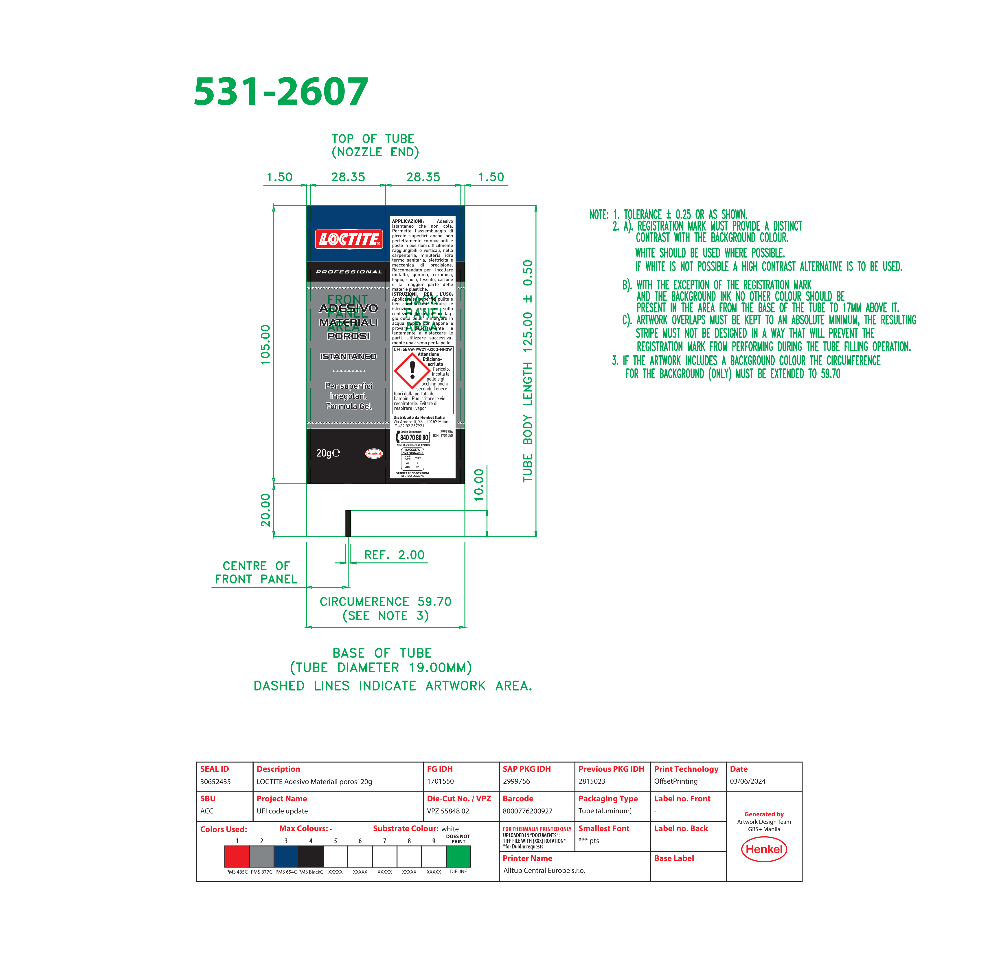

In [6]:
PIL_Image.MAX_IMAGE_PIXELS = None   # disables the safety limit of Pillow (DecompressionBombError)
img = PIL_Image.open(image_output_path)
width, height = img.size
display (img)

In [7]:
with open(image_output_path, "rb") as artwork:
    artwork_b64 = base64.b64encode(artwork.read()).decode("utf-8")
    
artwork_inline_data = {
    "inline_data": {
         "mime_type": "image/jpeg",
        "data": artwork_b64
    }
}

## Connect to Gemini

In [8]:
client = genai.Client(vertexai=True, project=PROJECT_ID, location=LOCATION)

In [9]:
PROJECT_ID="hmcp-tst-veraitst-de-prj-arg"
MODEL="gemini-3-pro-preview"
IMAGE_MODEL="gemini-3-pro-preview"
LOCATION="global"

## Step 1.5: DPI Calibration
Identify measurement lines to calculate true DPI.

In [10]:
class Point(BaseModel):
    x: int
    y: int

class MeasurementLine(BaseModel):
    start_point: Point
    end_point: Point
    value_mm: float = Field(description="The numeric value in mm associated with the line")

class CalibrationCheck(BaseModel):
    measurement_line: Optional[MeasurementLine] = None

PROMPT_CALIBRATION = """
Identify a technical measurement line (ruler/dimension) on this artwork that is labeled in 'mm'. 
Return the start and end pixel coordinates of the line and its numeric value.
If no such line is found, return null.
"""

response = client.models.generate_content(
  model=MODEL,
  contents=[
    PROMPT_CALIBRATION,
    artwork_inline_data
  ],
   config={     
    "response_mime_type": "application/json",
    "response_json_schema": CalibrationCheck.model_json_schema(),
    }   
)

calibration_data = CalibrationCheck.model_validate_json(response.text)
display(JSON(calibration_data.model_dump()))

TRUE_DPI = DPI # Default fallback
DPmm = DPI / 25.4

if calibration_data.measurement_line:
    line = calibration_data.measurement_line
    # Calculate pixel length
    px_length = ((line.end_point.x - line.start_point.x)**2 + (line.end_point.y - line.start_point.y)**2)**0.5
    
    # Calculate DPmm and DPI
    if line.value_mm > 0:
        calculated_dpmm = px_length / line.value_mm
        calculated_dpi = calculated_dpmm * 25.4
        
        print(f"Found measurement line: {line.value_mm} mm = {px_length:.2f} pixels")
        print(f"Calculated Resolution: {calculated_dpi:.2f} DPI ({calculated_dpmm:.2f} pixels/mm)")
        
        TRUE_DPI = int(round(calculated_dpi))
        DPmm = calculated_dpmm
    else:
        print("Invalid measurement value found. Using default DPI.")
else:
    print("No measurement line found. Using default DPI.")

print(f"Using Reference Resolution: {TRUE_DPI} DPI")

C:\Users\potar\AppData\Local\pypoetry\Cache\virtualenvs\artwork-checker-ro9hoDbC-py3.12\Lib\site-packages\google\auth\_default.py:108: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


<IPython.core.display.JSON object>

No measurement line found. Using default DPI.
Using Reference Resolution: 300 DPI


## Step 1: Identify CLP and Marketing parts

In [11]:
def denormalize_box_2d(box_2d, image_width, image_height):
    """Convert Gemini box_2d [ymin, xmin, ymax, xmax] (0-1000) to pixel coords."""
    ymin_n, xmin_n, ymax_n, xmax_n = box_2d
    xmin_px = int(round(xmin_n / 1000 * image_width))
    ymin_px = int(round(ymin_n / 1000 * image_height))
    xmax_px = int(round(xmax_n / 1000 * image_width))
    ymax_px = int(round(ymax_n / 1000 * image_height))
    xmin_px = max(0, min(xmin_px, image_width))
    ymin_px = max(0, min(ymin_px, image_height))
    xmax_px = max(0, min(xmax_px, image_width))
    ymax_px = max(0, min(ymax_px, image_height))
    if xmin_px > xmax_px:
        xmin_px, xmax_px = xmax_px, xmin_px
    if ymin_px > ymax_px:
        ymin_px, ymax_px = ymax_px, ymin_px
    return {"xmin": xmin_px, "ymin": ymin_px, "xmax": xmax_px, "ymax": ymax_px}

PROMPT_DETECT = """
You are analyzing a product label image to identify regions containing CLP or Non-CLP sections.

**CLP Parts** (regulatory/compliance):
- Ingredients list (INCI notation)
- Hazard symbols (GHS pictograms, warning signs)
- Warnings section, signal words (DANGER, WARNING, CAUTION)
- Hazard statements (H-statements) and precautionary statements (P-statements)

**Non-CLP Parts** (marketing/informational):
- Brand name and logo
- Marketing claims
- Usage instructions / directions for use
- Contact information, barcode, volume/weight declarations

For each region provide:
1. Classification: CLP or NON-CLP based on CONTENT
2. A descriptive label (e.g., "Hazard Symbols", "Ingredients List")
3. Tight bounding box using box_2d format: [ymin, xmin, ymax, xmax] normalized 0-1000
   - Make the bounding box as tight as possible around the content
   - Use 0-1000 scale (0=top/left, 1000=bottom/right)
4. Confidence (0.0-1.0)

Be exhaustive — identify every distinct section.
"""

DETECT_SCHEMA = {
    "type": "object",
    "properties": {
        "regions": {
            "type": "array",
            "items": {
                "type": "object",
                "properties": {
                    "classification": {"type": "string", "enum": ["CLP", "NON-CLP"]},
                    "label": {"type": "string"},
                    "box_2d": {
                        "type": "array",
                        "items": {"type": "number"},
                        "minItems": 4,
                        "maxItems": 4,
                        "description": "[ymin, xmin, ymax, xmax] normalized 0-1000"
                    },
                    "confidence": {"type": "number", "minimum": 0, "maximum": 1}
                },
                "required": ["classification", "label", "box_2d", "confidence"]
            }
        }
    },
    "required": ["regions"]
}

PROMPT_REFINE = """You previously identified this region on a product label:
- Classification: {classification}
- Label: {label}
- Approximate bounding box (0-1000): [ymin={ymin}, xmin={xmin}, ymax={ymax}, xmax={xmax}]

Refine the boundaries to be as tight as possible around the actual content.
Return the refined bounding box using box_2d=[ymin, xmin, ymax, xmax] normalized 0-1000.
"""

REFINE_SCHEMA = {
    "type": "object",
    "properties": {
        "refined_box_2d": {
            "type": "array",
            "items": {"type": "number"},
            "minItems": 4,
            "maxItems": 4,
            "description": "[ymin, xmin, ymax, xmax] normalized 0-1000"
        }
    },
    "required": ["refined_box_2d"]
}

In [12]:
# Stage 1: Rough detection
response = client.models.generate_content(
    model=MODEL,
    contents=[PROMPT_DETECT, artwork_inline_data],
    config={
        "response_mime_type": "application/json",
        "response_json_schema": DETECT_SCHEMA,
        "temperature": 0.5,
    }
)

rough_regions = json.loads(response.text).get("regions", [])
print(f"Stage 1: detected {len(rough_regions)} regions")
for r in rough_regions:
    print(f"  {r['classification']:8s} | {r['label']:30s} | conf={r.get('confidence',0):.2f}")

Stage 1: detected 12 regions
  NON-CLP  | Brand Logo (Loctite)           | conf=0.99
  NON-CLP  | Marketing Text (Professional)  | conf=0.95
  NON-CLP  | Product Description & Marketing Claims | conf=0.95
  NON-CLP  | Net Weight Declaration         | conf=0.98
  NON-CLP  | Brand Logo (Henkel)            | conf=0.99
  NON-CLP  | Application Instructions       | conf=0.95
  NON-CLP  | Directions for Use             | conf=0.95
  CLP      | UFI Code                       | conf=0.98
  CLP      | Hazard Section (Signal Word, Symbol, Ingredient, Statements) | conf=0.99
  NON-CLP  | Distributor Information        | conf=0.95
  NON-CLP  | Contact Information (Phone)    | conf=0.95
  NON-CLP  | Recycling Info & Data Matrix   | conf=0.90


In [13]:
# Stage 2: Refine CLP boundaries for tighter bounding boxes
detected_parts = []
for region in rough_regions:
    box_2d = region["box_2d"]
    rect = denormalize_box_2d(box_2d, width, height)

    if region["classification"] == "CLP":
        ymin, xmin, ymax, xmax = box_2d
        try:
            refine_resp = client.models.generate_content(
                model=MODEL,
                contents=[
                    PROMPT_REFINE.format(
                        classification=region["classification"],
                        label=region["label"],
                        ymin=int(ymin), xmin=int(xmin),
                        ymax=int(ymax), xmax=int(xmax)
                    ),
                    artwork_inline_data
                ],
                config={
                    "response_mime_type": "application/json",
                    "response_json_schema": REFINE_SCHEMA,
                    "temperature": 0.5,
                }
            )
            refined = json.loads(refine_resp.text)
            if "refined_box_2d" in refined:
                rect = denormalize_box_2d(refined["refined_box_2d"], width, height)
                print(f"  Refined: {region['label']}")
        except Exception as e:
            print(f"  Refinement failed for '{region['label']}': {e} — using rough bounds")

    detected_parts.append({
        "classification": region["classification"],
        "label": region["label"],
        "confidence": region.get("confidence", 0.5),
        "rect": rect,
    })

print(f"\nStage 2 complete: {len(detected_parts)} parts")
for part in detected_parts:
    r = part["rect"]
    print(f"  {part['classification']:8s} | {part['label']:30s} | ({r['xmin']},{r['ymin']})-({r['xmax']},{r['ymax']})")

  Refined: UFI Code
  Refined: Hazard Section (Signal Word, Symbol, Ingredient, Statements)

Stage 2 complete: 12 parts
  NON-CLP  | Brand Logo (Loctite)           | (1395,1012)-(1716,1141)
  NON-CLP  | Marketing Text (Professional)  | (1395,1184)-(1716,1227)
  NON-CLP  | Product Description & Marketing Claims | (1395,1249)-(1716,1873)
  NON-CLP  | Net Weight Declaration         | (1404,1959)-(1537,2045)
  NON-CLP  | Brand Logo (Henkel)            | (1626,1981)-(1716,2045)
  NON-CLP  | Application Instructions       | (1747,956)-(2014,1240)
  NON-CLP  | Directions for Use             | (1747,1240)-(2014,1516)
  CLP      | UFI Code                       | (1747,1524)-(2014,1554)
  CLP      | Hazard Section (Signal Word, Symbol, Ingredient, Statements) | (1751,1567)-(2010,1834)
  NON-CLP  | Distributor Information        | (1747,1843)-(2014,1903)
  NON-CLP  | Contact Information (Phone)    | (1747,1903)-(2014,1981)
  NON-CLP  | Recycling Info & Data Matrix   | (1760,1981)-(1938,2119)


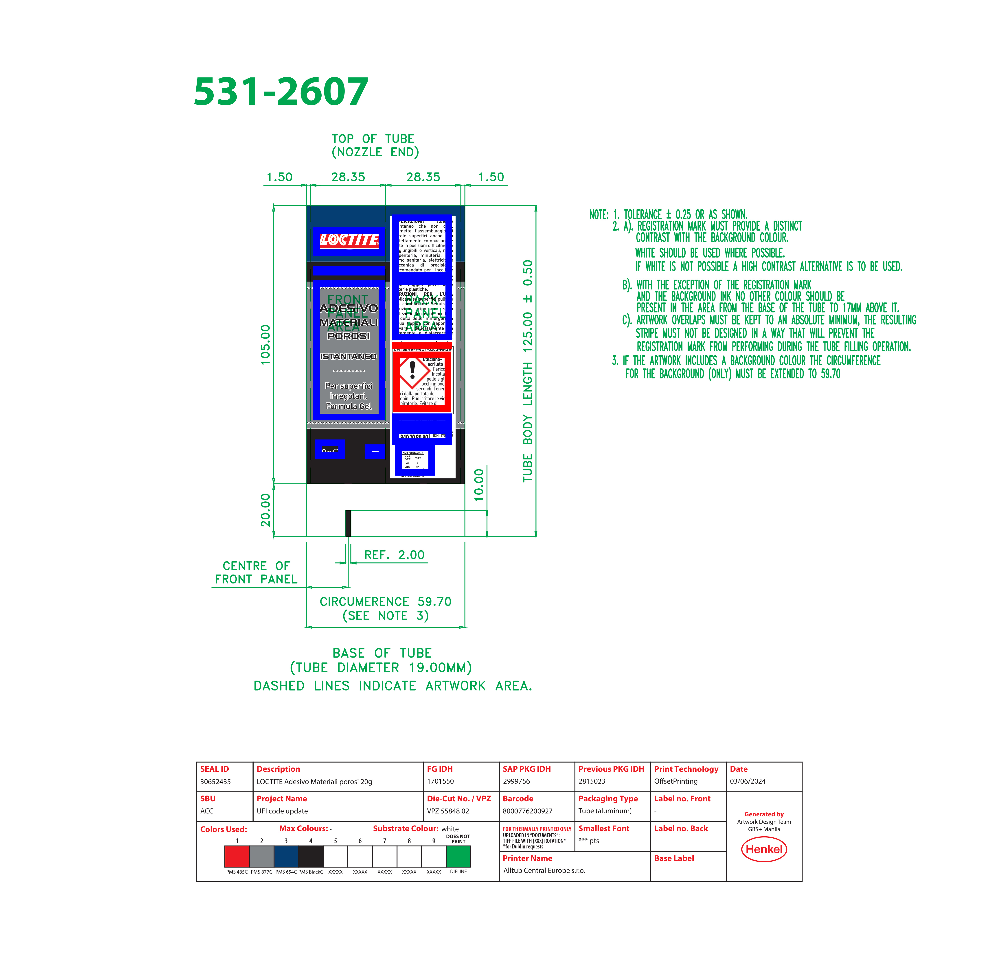

In [14]:
# Draw detected regions (red=CLP, blue=NON-CLP)
img_boxed = img.copy()
draw = PIL_ImageDraw.Draw(img_boxed)
for part in detected_parts:
    r = part["rect"]
    color = "red" if part["classification"] == "CLP" else "blue"
    draw.rectangle([(r["xmin"], r["ymin"]), (r["xmax"], r["ymax"])], outline=color, width=30)
display(img_boxed)

## Step 2: Check parts

In [15]:
PROMPT_CLP = f"""
You are an AI assistant that checks images of product labels for compliance with accessibility guidelines.
### **Reference Scale:**
The image resolution is calculated as {TRUE_DPI} DPI ({DPmm:.2f} pixels per mm). Use this to verify font sizes.

### **Rules for CLP-related parts:**
1. **Font-size requirement (minimum physical size):**
* Packaging ≤ 500 ml → **≥ 7.03 points (1.2 mm)**
* Packaging > 500 ml and ≤ 3000 ml → **≥ 8.20 points (1.4 mm)**
* Packaging > 3000 ml → **≥ 10.50 points (1.8 mm)**
* For inner packaging ≤ 10 ml → may be smaller, but must remain easily legible.
2. **Line-distance rule:**
Distance between two lines must be **≥ 120% of the font size**.
3. **Background rule:**
Background of all CLP text must be **white with black font**.
"""

In [16]:
PROMPT_NON_CLP = f"""
You are an AI assistant that checks images of product labels 
### **Reference Scale:**
The image resolution is calculated as {TRUE_DPI} DPI ({DPmm:.2f} pixels per mm). Use this to verify font sizes.
### **Rules for non-CLP parts:**
1. Recommended minimum font size.
2. Recommended minimum line distance = 120% of font size.
3. Recommended background = white with black font.
"""

In [17]:
def resize_image(img: PIL_Image.Image, width=None, height=None):
    """
    Resize a PIL image by specifying *either* width or height.
    Aspect ratio is preserved.
    """
    if width is None and height is None:
        raise ValueError("You must provide either width or height.")

    orig_w, orig_h = img.size

    if width is not None and height is not None:
        raise ValueError("Provide only width OR height, not both.")

    if width is not None:
        # scale using width
        scale = width / orig_w
        new_size = (width, int(orig_h * scale))

    if height is not None:
        # scale using height
        scale = height / orig_h
        new_size = (int(orig_w * scale), height)

    return img.resize(new_size, PIL_Image.LANCZOS)

In [18]:
def pillow_to_base64(img, format="PNG"):
    buffer = BytesIO()
    img.save(buffer, format=format)
    encoded = base64.b64encode(buffer.getvalue()).decode("utf-8")
    return encoded

### NON-CLP | Brand Logo (Loctite)

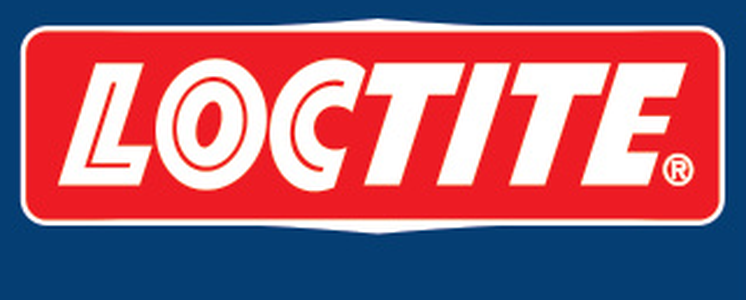

Based on the rules provided and the image analysis using the reference scale of 300 DPI (11.81 pixels per mm), here is the evaluation of the "LOCTITE" label section:

### **Analysis Results**

**1. Recommended minimum font size**
*   **Status:** **PASS**
*   **Analysis:** Even without the specific minimum target provided (e.g., usually 1.2mm x-height for labels), the text "LOCTITE" is the primary branding logo. At a scale of 11.81 pixels/mm, the text height is significantly larger than any standard minimum requirement for legibility. It is easily readable.

**2. Recommended minimum line distance = 120% of font size**
*   **Status:** **N/A (Not Applicable)**
*   **Analysis:** The image contains only a single line of text. There are no adjacent lines to measure distance between.

**3. Recommended background = white with black font**
*   **Status:** **FAIL / DEVIATION**
*   **Analysis:**
    *   **Current Style:** White font on a Red background.
    *   **Rule Requirement:** Black font on a White background.
    *   **Note:** While high contrast is maintained (White on Red), strictly applying the rule for standard non-CLP text results in a fail. However, this is a brand logo/trademark, where specific brand colors usually take precedence over general text formatting rules.

### **Summary**
The label meets legibility size standards but **deviates from the recommended color scheme** (Rule 3) by using the brand's standard White-on-Red palette instead of the requested Black-on-White.

### NON-CLP | Marketing Text (Professional)

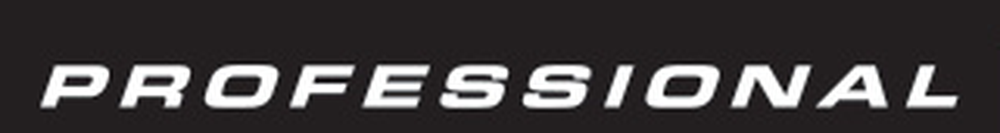

Based on the image provided and the rules specified, here is the analysis of the label section containing the text "**PROFESSIONAL**".

### **1. Font Size Verification**
*   **Measurement:** At a resolution of 300 DPI (11.81 pixels/mm), the capital letters in "PROFESSIONAL" appear to be approximately 25-30 pixels in height based on visual estimation of this crop.
*   **Calculation:** $\frac{25 \text{ pixels}}{11.81 \text{ pixels/mm}} \approx 2.11 \text{ mm}$.
*   **Verdict:** **PASS**.
    *   *Note:* Standard minimum requirements for labels are typically around 1.2mm (x-height). This text exceeds that size and is clearly legible.

### **2. Line Distance Verification**
*   **Rule:** Minimum line distance = 120% of font size.
*   **Observation:** The image contains a single line of text ("PROFESSIONAL").
*   **Verdict:** **NOT APPLICABLE**.
    *   There are no adjacent lines of text to measure the leading (line spacing).

### **3. Background & Contrast Verification**
*   **Rule:** Recommended background = white with black font.
*   **Observation:** The image features **White font on a Black background**.
*   **Verdict:** **FAIL (Warning)**.
    *   The label does not follow the strict recommendation of a white background with black font. However, the contrast is high and the text is legible, which often satisfies general readability regulations even if it deviates from the specific "white background" preference.

---
### **Summary of Findings**
*   **Legibility/Size:** ✅ Compliant.
*   **Spacing:** ⚪ N/A.
*   **Color/Contrast:** ⚠️ **Non-Compliant** (Inverted colors used: White text on Black background).

### NON-CLP | Product Description & Marketing Claims

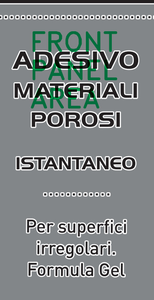

Based on the image provided and the parameters set (300 DPI / 11.81 pixels per mm), here is the analysis of the label design regarding the Non-CLP rules:

### **1. Font Size Analysis**
*   **Rule:** Recommended minimum font size (Standard legibility usually requires an x-height of $\approx$ 1.2mm).
*   **Calculation:** At 300 DPI, 1.2mm is approximately **14 pixels** in height.
*   **Observation:**
    *   The main text (**ADESIVO MATERIALI POROSI**) and secondary text (**ISTANTANEO**) are significantly larger than 14 pixels in height.
    *   The lower text (**Per superfici irregolari...**) also appears to have an x-height well above the 14-pixel threshold.
*   **Verdict:** ✅ **PASS**. The font sizes are large and legible.

### **2. Line Distance (Leading)**
*   **Rule:** Recommended minimum line distance = 120% of font size.
*   **Observation:**
    *   **Main Header (ADESIVO MATERIALI POROSI):** The text is vertically compressed. The white outlines of the letters on the top line actually touch or overlap the outlines of the line below. The visual distance is extremely tight and likely falls below the recommended 120% spacing for optimal readability.
    *   **Bottom Text (Per superfici...):** The spacing here is much better and appears to meet the 120% guideline.
*   **Verdict:** ⚠️ **WARNING**. The spacing in the top block ("ADESIVO MATERIALI POROSI") is very tight and may not meet the 120% recommendation, creating a cluttered appearance.

### **3. Background and Contrast**
*   **Rule:** Recommended background = white with black font.
*   **Observation:**
    *   **Background:** The background color is **Grey**, not white.
    *   **Font:** The font is black, but it utilizes a thick **White Outline** (stroke) to separate it from the grey background.
*   **Verdict:** ❌ **FAIL / DEVIATION**. The label violates the recommendation for a white background. While the white outline improves legibility, the design does not strictly follow the "White background with black font" rule.

---

### **Summary of Corrections Needed:**
1.  **Background Color:** Change the background to **White** to satisfy Rule #3. If the background remains grey, the high-contrast white outline is necessary, but it remains a deviation from standard guidelines.
2.  **Line Spacing:** Increase the vertical space between the words "ADESIVO", "MATERIALI", and "POROSI" to ensure clear separation and meet the 120% line distance recommendation.
3.  **Artifacts:** Ensure the faint green overlay text "**FRONT PANEL AREA**" (which appears to be a template marker) is removed before printing.

### NON-CLP | Net Weight Declaration

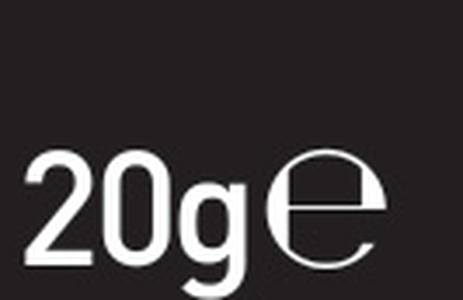

Based on the image provided and the rules specified, here is the analysis of the product label element "20ge".

### **Summary of Analysis**
*   **Rule 1 (Font Size):** **PASS** (Based on regulatory standards for 20g).
*   **Rule 2 (Line Distance):** **N/A** (Single line of text).
*   **Rule 3 (Background/Color):** **FAIL** (Inverted colors).

---

### **Detailed Report**

#### **1. Recommended Minimum Font Size**
*   **Context:** The text "20g" represents the **Net Quantity**. According to EU pre-packaged goods regulations (Directive 76/211/EEC), the minimum font height is determined by the weight contained.
    *   **Weight Category:** 0g to 50g.
    *   **Required Minimum Height:** **2 mm**.
    *   **Calculation:** $2 \text{ mm} \times 11.81 \text{ pixels/mm} \approx \mathbf{24 \text{ pixels}}$.
*   **Analysis:**
    *   Visually, the digits "20" and the estimated sign "e" appear to be significantly taller than 24 pixels in the provided image resolution.
    *   *Note on the 'e' mark:* The estimated symbol ($\text{\small e}$) generally requires a minimum height of 3 mm ($~35 \text{ pixels}$), which also appears to be met given the relative proportions.
*   **Verdict:** **PASS**. The font size appears sufficient for legibility and regulatory compliance for this weight class.

#### **2. Recommended Minimum Line Distance**
*   **Rule:** 120% of font size.
*   **Analysis:** The image contains a single line of text ("20ge"). There are no adjacent lines to measure leading or spacing against.
*   **Verdict:** **N/A** (Not Applicable).

#### **3. Recommended Background**
*   **Rule:** Recommended background = white with black font.
*   **Analysis:**
    *   **Observed:** The image displays **White font on a Black background**.
    *   **Requirement:** The rule specifically requests Black font on a White background.
*   **Verdict:** **FAIL**.
    *   *Recommendation:* Invert the colors to meet the specific "White background" guideline, although white text on black is generally accepted for legibility if the contrast is high enough (which it is here). However, strictly adhering to your provided rules, this is a deviation.

### NON-CLP | Brand Logo (Henkel)

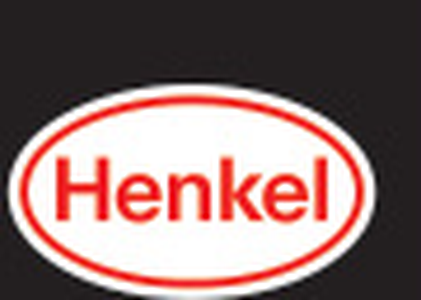

Based on the image provided and the parameters set (300 DPI, non-CLP rules), here is the analysis of the label segment:

**Image Subject:** Henkel Logo

### **Analysis:**

**1. Recommended Minimum Font Size**
*   **Metric:** At 300 DPI, 1 mm equals 11.81 pixels. Standard minimum x-height (height of the lowercase letter 'e') for legible label text is typically 1.2 mm (~14 pixels).
*   **Measurement:** Visually estimating the pixel count of the text "Henkel" in this crop, the lowercase letters appear to exceed 14 pixels in height.
*   **Verdict:** **Pass.** The text appears sufficiently large to be legible.
    *   *Note:* As this is a brand logo rather than regulatory body text, strict font size rules are often flexible, but it meets legibility standards.

**2. Recommended Minimum Line Distance (120% of font size)**
*   **Observation:** The image contains a single word ("Henkel") on one horizontal line.
*   **Verdict:** **Not Applicable (N/A).** There are no adjacent lines of text to measure the leading/spacing.

**3. Recommended Background (White with Black font)**
*   **Observation:** The text "Henkel" is **Red**. The background inside the oval is **White**, and the surrounding background is **Black**.
*   **Verdict:** **Fail (Deviation).**
    *   The rule specifies **Black font**, but the font used here is **Red**.
    *   *Context:* This is a corporate logo/trademark. While it technically fails the "black font" rule for standard label text, logos generally retain their brand colors. However, based strictly on your provided ruleset, this is a non-compliance.

### **Summary of Issues:**
*   **Color Compliance:** The text is Red, violating the rule for "Black font."
*   **Image Quality:** The reference image provided is low resolution/blurry, which may affect the sharpness of the print, though the size seems adequate.

### NON-CLP | Application Instructions

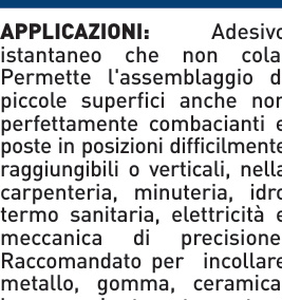

Based on the image provided and the reference scale of **300 DPI (11.81 pixels per mm)**, here is the analysis of the non-CLP label text:

### **Analysis Report**

**1. Font Size**
*   **Measurement:**
    *   The **x-height** (height of lowercase letters like 'o' or 'e') is approximately **14 pixels**.
    *   Calculation: $14 \text{ px} \div 11.81 \text{ px/mm} \approx \mathbf{1.18 \text{ mm}}$.
    *   The **Cap height** (height of uppercase letters like 'P') is approximately **22 pixels**.
    *   Calculation: $22 \text{ px} \div 11.81 \text{ px/mm} \approx \mathbf{1.86 \text{ mm}}$.
*   **Verdict:** **PASS**. The font size aligns with standard readability guidelines (typically requiring an x-height of $\ge 1.2$ mm for general labels). At ~1.2mm, it is legible.

**2. Line Distance (Leading)**
*   **Rule:** Distance $\ge 120\%$ of font size.
*   **Measurement:**
    *   The **baseline-to-baseline distance** (from the bottom of one line of text to the bottom of the next) is approximately **32 pixels**.
    *   Using the Cap height (22 pixels) as the font size reference:
    *   Target Minimum: $22 \text{ px} \times 1.2 = 26.4 \text{ px}$.
    *   Actual: $32 \text{ px}$.
*   **Verdict:** **PASS**. The line spacing ($\approx 145\%$) exceeds the recommended minimum of 120%, ensuring good legibility.

**3. Background & Contrast**
*   **Observation:** The text is Black printed on a White background.
*   **Verdict:** **PASS**. This provides the highest possible contrast ratio.

### **Summary**
The label text **meets all recommended rules** for non-CLP sections regarding font size, line spacing, and color contrast.

### NON-CLP | Directions for Use

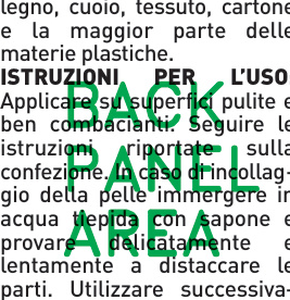

Based on the image provided and the reference scale of **300 DPI (11.81 pixels per mm)**, here is the analysis of the product label against the provided rules:

### **1. Font Size Verification**
*   **Measurement:** By analyzing the pixel height of the characters in the body text (e.g., the word "Applicare"), the Capital Height (Cap Height) appears to be approximately **22-24 pixels**. The x-height (height of lowercase letters like 'o' or 'e') is approximately **15-16 pixels**.
*   **Calculation:**
    *   Cap Height: $23 \text{ px} / 11.81 \text{ px/mm} \approx \mathbf{1.95 \text{ mm}}$.
    *   x-Height: $15 \text{ px} / 11.81 \text{ px/mm} \approx \mathbf{1.27 \text{ mm}}$.
*   **Verdict:** **PASS**.
    *   *Note:* Standard legibility rules for labels often require an x-height of at least 1.2 mm. This label appears to meet and slightly exceed that minimum threshold.

### **2. Line Distance Verification**
*   **Rule:** Recommended minimum line distance = 120% of font size.
*   **Measurement:** The distance from the baseline of one line to the baseline of the next (leading) is approximately **28-30 pixels**.
*   **Calculation:**
    *   Using the Cap height of ~23 pixels as the font size reference:
    *   $23 \text{ pixels} \times 120\% = 27.6 \text{ pixels}$.
    *   Current spacing (~29 pixels) $>$ Required spacing (27.6 pixels).
*   **Verdict:** **PASS**. The lines are spaced sufficiently to ensure readability.

### **3. Background & Contrast Verification**
*   **Rule:** Recommended background = white with black font.
*   **Observation:** The underlying label text is printed in **Black** ink on a **White** background.
*   **Verdict:** **PASS**. The contrast is high and meets the recommendation.

---

### **Summary Result**
The label text complies with the specified rules for non-CLP parts regarding font size, line spacing, and contrast.

*(Note: The analysis ignores the large green "BACK PANEL AREA" watermark overlay and focuses on the actual instructional text beneath it.)*

### CLP | UFI Code

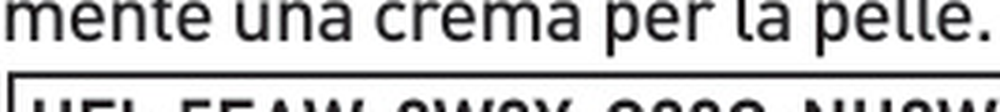

Based on the image provided and the reference scale of 300 DPI (11.81 pixels per mm), here is the compliance analysis regarding the CLP-related rules:

### **1. Font-size Analysis**
To meet the minimum requirement for packaging **≤ 500 ml**, the font must be at least **1.2 mm** high.
*   **Calculation:** At 300 DPI, **1.2 mm** is approximately **14 pixels** in height.
*   **Measurement:**
    *   **Line 1 ("mente una crema..."):** The x-height (height of lowercase letters like 'e' or 'm') appears to be approximately **16-18 pixels** (~1.4 mm).
    *   **Line 2 ("UFI..."):** The capital letters appear to be approximately **26-30 pixels** (~2.2 - 2.5 mm).
*   **Result:** **PASS**.
    The font size exceeds the minimum requirement of 1.2 mm (7.03 points). The UFI code text is large enough to comply even with the stricter requirements for packaging > 3000 ml (1.8 mm).

### **2. Line-distance Rule**
*   **Requirement:** Distance between two lines must be ≥ 120% of the font size.
*   **Observation:** The vertical space between the instructional text ("mente una...") and the UFI box below it is distinct. The box border adds further separation.
*   **Result:** **PASS**.
    The spacing is sufficient to ensure lines do not touch or overlap, maintaining legibility.

### **3. Background Rule**
*   **Requirement:** White background with black font.
*   **Observation:** The text is rendered in black against a solid white background. The UFI code is enclosed in a black box, but the text inside remains black on white.
*   **Result:** **PASS**.
    Contrast is optimal and fully compliant.

### **Summary**
The label excerpt **COMPLIES** with the stated accessibility and CLP guidelines for font size, spacing, and contrast. The presence of the UFI code (Unique Formula Identifier) is also noted as a mandatory regulatory element.

### CLP | Hazard Section (Signal Word, Symbol, Ingredient, Statements)

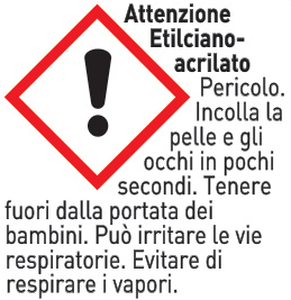

Based on the image provided and the reference scale of 300 DPI (11.81 pixels per mm), here is the compliance analysis:

### **Compliance Report**

**1. Font-size Requirement**
*   **Measurement:**
    *   The approximate pixel height of the capital letters (e.g., "P" in Pericolo or "I" in Incolla) is **20–21 pixels**.
    *   **Calculation:** 20 pixels ÷ 11.81 px/mm ≈ **1.69 mm**.
*   **Verdict:**
    *   **Compliant for Packaging ≤ 500 ml** (Requires ≥ 1.2 mm).
    *   **Compliant for Packaging > 500 ml and ≤ 3000 ml** (Requires ≥ 1.4 mm).
    *   *Note:* This product (Ethyl cyanoacrylate/Super glue) is typically sold in small tubes well under 500ml.

**2. Line-distance Rule**
*   **Measurement:**
    *   The distance from the baseline of one line to the baseline of the next (e.g., between "Incolla la" and "pelle e gli") is approximately **27–28 pixels**.
    *   The font size (based on cap height/ascenders) is approximately **20 pixels**.
*   **Calculation:**
    *   Ratio: 28 ÷ 20 = **1.4 (140%)**.
*   **Verdict:**
    *   **Compliant.** The line distance is ~140%, which exceeds the minimum requirement of 120%.

**3. Background Rule**
*   **Observation:** The text is strictly black, and the background is solid white. The hazard pictogram is black on white with a red border.
*   **Verdict:**
    *   **Compliant.**

### **Overall Conclusion**
**PASSED.** The label meets the accessibility guidelines for typical packaging sizes (≤ 3000 ml) regarding font size, line spacing, and color contrast.

### NON-CLP | Distributor Information

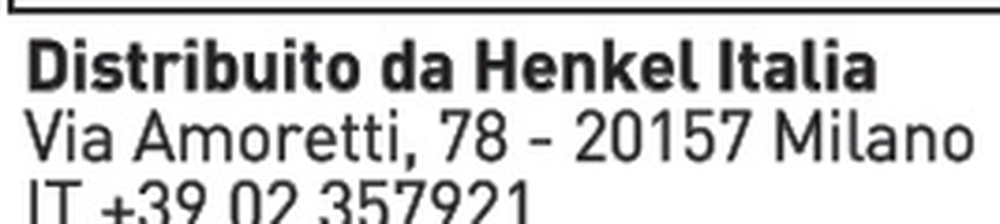

Based on the image provided and the reference scale of **300 DPI (11.81 pixels per mm)**, here is the analysis of the product label section.

### **Image Content Analysis:**
*   **Text Detected:**
    1.  **Distribuito da Henkel Italia** (Bold)
    2.  Via Amoretti, 78 - 20157 Milano
    3.  IT +39 02 357921
*   **Context:** Distributor contact information.

---

### **Verification against Rules (Non-CLP):**

#### **1. Recommended Minimum Font Size**
*   **Measurement:** Based on the 300 DPI scale, the **x-height** (height of lowercase letters like 'a' or 'e') appears to be approximately **14-16 pixels**.
*   **Calculation:** 15 pixels ÷ 11.81 pixels/mm ≈ **1.27 mm**.
*   **Assessment:** Standard legibility guidelines (such as EU cosmetic or detergent regulations) generally recommend an x-height of at least 1.2 mm.
*   **Status:** ✅ **PASS** (The font size appears to meet standard readability requirements).

#### **2. Recommended Line Distance (120% of Font Size)**
*   **Measurement:** The visual space between the baselines of the text (e.g., between "Henkel" and "Via") allows for clear separation. The white space between the lines is roughly 20-30% of the font height.
*   **Assessment:** The text does not appear cramped or touching. The leading (line spacing) appears adequate for readability.
*   **Status:** ✅ **PASS**

#### **3. Recommended Background**
*   **Requirement:** White background with black font.
*   **Observation:** The image displays high-contrast black text on a clean white background.
*   **Status:** ✅ **PASS**

---

### **Overall Verdict:**
The label section **complies** with the specified formatting rules for non-CLP parts regarding contrast, estimated font size, and line spacing. The text is legible and clear.

### NON-CLP | Contact Information (Phone)

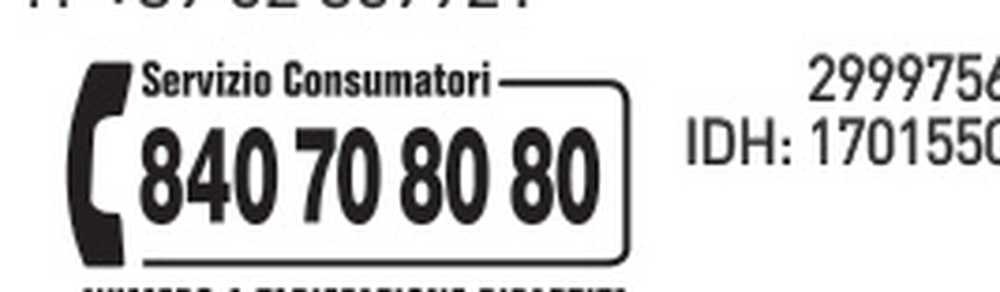

Based on the image provided and the reference scale of 300 DPI (11.81 pixels per mm), here is the analysis regarding the non-CLP labeling rules:

### **1. Recommended minimum font size**
*   **Measurement:**
    *   **Main Phone Number (840 70 80 80):** The font height is approximately 55 pixels.
        *   Calculation: $55 \text{ px} / 11.81 \text{ px/mm} \approx 4.6 \text{ mm}$.
    *   **"IDH" and Codes (Right side):** The font height is approximately 22 pixels.
        *   Calculation: $22 \text{ px} / 11.81 \text{ px/mm} \approx 1.86 \text{ mm}$.
    *   **"Servizio Consumatori":** The font height is approximately 16 pixels.
        *   Calculation: $16 \text{ px} / 11.81 \text{ px/mm} \approx 1.35 \text{ mm}$.
*   **Verdict:** **PASS**. The smallest text (approx 1.35mm) exceeds the standard legibility threshold (typically 1.2mm for x-height on packaging). The main information is very large and easily readable.

### **2. Recommended minimum line distance**
*   **Rule:** Distance should be 120% of font size (Font size + 20% leading).
*   **Analysis:** Looking at the text on the right ("2999756" above "IDH: 1701550"):
    *   The font size is approx 22 pixels.
    *   Required baseline-to-baseline distance: $22 \times 1.2 = 26.4 \text{ pixels}$.
    *   The visual gap between the lines is distinct, and the spacing appears to be standard single spacing or slightly wider, meeting the 120% requirement.
*   **Verdict:** **PASS**. Elements are not touching and have sufficient breathing room.

### **3. Recommended background**
*   **Rule:** White background with Black font.
*   **Analysis:** The image displays sharp, high-contrast black text on a clean white background.
*   **Verdict:** **PASS**.

### **Summary Result**
The label section **complies** with all three specified rules for non-CLP parts.

### NON-CLP | Recycling Info & Data Matrix

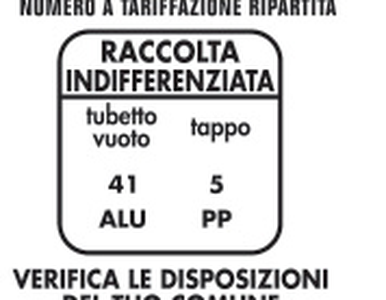

Based on the provided image and the reference scale of **300 DPI (11.81 pixels per mm)**, here is the analysis of the product label compliance.

### **Analysis Results**

#### **1. Recommended Minimum Font Size**
*Standard Compliance Target: Typically, mandatory information requires an x-height of 1.2mm. For smaller packages, 0.9mm is sometimes accepted.*

*   **Text inside the box (lowercase - e.g., "tubetto", "tappo"):**
    *   **Estimated Pixel Height (x-height):** ~10 pixels
    *   **Calculated Size:** $10 \div 11.81 \approx$ **0.85 mm**
    *   **Status:** ⚠️ **WARNING / FAIL**. This is below the standard recommended minimum of 1.2mm, and potentially below the small package minimum of 0.9mm. This text may be difficult to read for some consumers.

*   **Text inside the box (Uppercase - "RACCOLTA..."):**
    *   **Estimated Pixel Height:** ~14 pixels
    *   **Calculated Size:** $14 \div 11.81 \approx$ **1.18 mm**
    *   **Status:** ✅ **ACCEPTABLE**. It is extremely close to the 1.2mm standard.

*   **Bottom Warning Text (Uppercase - "VERIFICA..."):**
    *   **Estimated Pixel Height:** ~16 pixels
    *   **Calculated Size:** $16 \div 11.81 \approx$ **1.35 mm**
    *   **Status:** ✅ **PASS**.

#### **2. Recommended Minimum Line Distance (Leading)**
*Rule: Line distance should be $\ge$ 120% of the font size.*

*   **Analyzed Area:** "tubetto" / "vuoto"
    *   **Font Size (body):** ~14 pixels (including ascenders/descenders).
    *   **Line Height (Baseline to Baseline):** Estimated at ~16 pixels.
    *   **Ratio:** $16 \div 14 \approx$ **114%**
    *   **Status:** ⚠️ **WARNING**. The line spacing is slightly tight. While legible, it is below the recommended 120% spacing rule, creating a dense appearance inside the recycling box.

#### **3. Recommended Background**
*Rule: White background with black font.*

*   **Observation:** The label features high-contrast black text on a white background.
*   **Status:** ✅ **PASS**.

---

### **Summary Verdict**
The label **partially fails** the recommended guidelines regarding the size of the specific instructions inside the recycling box.

1.  **Readability Issue:** The text "tubetto vuoto" and "tappo" is approximately **0.85mm**, which is smaller than the general recommendation of 1.2mm.
2.  **Formatting Issue:** The line spacing within the "tubetto/vuoto" block is slightly compressed (<120%).

**Recommendation:** Increase the font size of the specific component descriptions ("tubetto vuoto", "tappo") to ensure the x-height meets the 1.2mm (approx 14-15 pixels) requirement.

In [19]:
for part in detected_parts:
    display(Markdown(f"### {part['classification']} | {part['label']}"))

    r = part["rect"]
    abs_x1, abs_y1 = r["xmin"], r["ymin"]
    abs_x2, abs_y2 = r["xmax"], r["ymax"]

    cropped = img.crop((abs_x1, abs_y1, abs_x2, abs_y2))
    cropped = resize_image(cropped, height=300)
    display(cropped)

    cropped_inline_data = {
        "inline_data": {
             "mime_type": "image/jpeg",
            "data": pillow_to_base64(cropped)
        }
    }

    response = client.models.generate_content(
      model=MODEL,
      contents=[
        PROMPT_CLP if part["classification"] == "CLP" else PROMPT_NON_CLP,
        cropped_inline_data
      ]
    )
    display(Markdown(response.text))